In [1]:
import h5py
import matplotlib.pyplot as plt
import numpy as np

## 第一节：使用自己构造的观测矩阵

In [4]:
ori = h5py.File("./common_res/ori.h5")["values"]

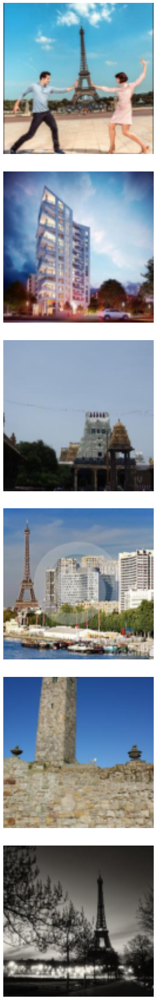

In [12]:
plt.figure(figsize = (1*5, 6*5))
for i in range(6):
    plt.subplot(6,1,i+1)
    plt.imshow(ori[i].transpose(1,2,0))    
    plt.axis("off")
plt.tight_layout(pad=2)
plt.savefig("./res_images/common_ori.jpg")

In [6]:
rates=[
    # 0.1526,
    0.1,
    0.05,
    0.01
]
matrix_names=[
    "get_gussian_measure_matrix",
    "get_bernoulli_measure_matrix",
    "get_random_svd_compose_measure_matrix",
    "get_sparse_random_measure_matrix",
    "get_toeplitz_loop_measure_matrix", 
    "get_hada_measure_matrix",
    "get_fft_measure_matrix"
]
matrix_names.reverse()
rates.reverse()

In [7]:
df1 = h5py.File("./common_res/diff_matrix_ode.h5")
df2 = h5py.File("./common_res/diff_matrix_sde.h5")
df3 = h5py.File("./common_res/diff_rates_ode.h5")
df4 = h5py.File("./common_res/diff_rates_sde.h5")

In [8]:
diff_matrix_ode = [np.array(df1[i]) for i in matrix_names]
diff_matrix_sde = [np.array(df2[i]) for i in matrix_names]

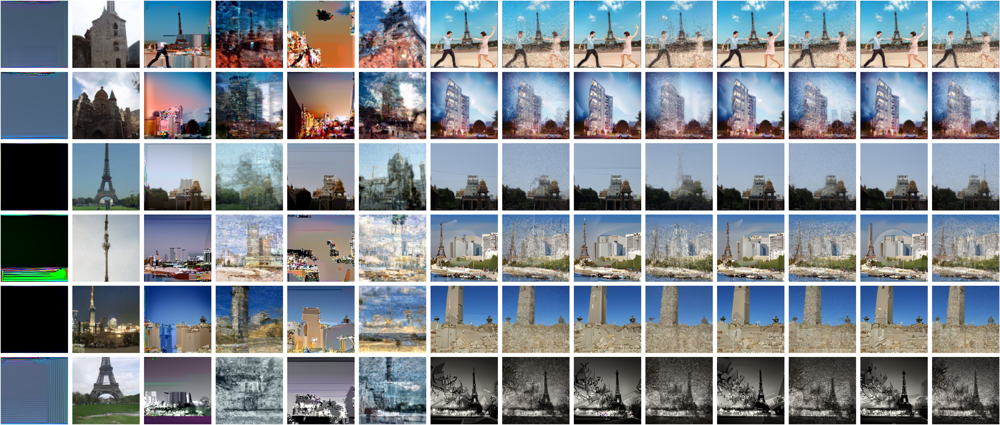

In [13]:
c = len(matrix_names)
r = 6
plt.figure(figsize = (2*c*10, r*10))
for i in range(c):
    ode_res = diff_matrix_ode[i]
    sde_res = diff_matrix_sde[i]  
    for j in range(r):
        img_ode = ode_res[j]
        img_sde = sde_res[j]
        plt.subplot(r,2*c,2*i+1+j*2*c)
        plt.imshow(img_ode.transpose(1,2,0))
        plt.axis("off")
        
        plt.subplot(r,2*c,2*i+1+j*2*c+1)
        plt.imshow(img_sde.transpose(1,2,0))
        plt.axis("off")
plt.tight_layout(pad=4)
plt.savefig("./res_images/diff_matrix.jpg")

In [9]:
diff_rates_ode= [np.array(df3["rate_{}".format(i)]) for i in rates] + [diff_matrix_ode[-1]]
diff_rates_sde=[np.array(df4["rate_{}".format(i)]) for i in rates] + [diff_matrix_sde[-1]]

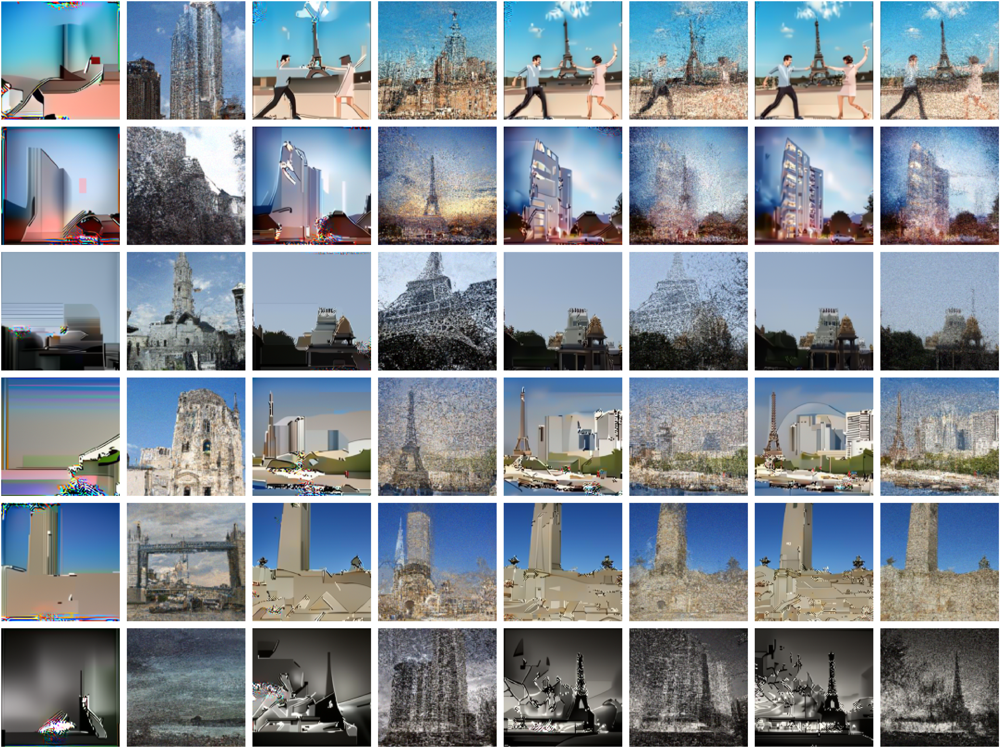

In [11]:
c = len(rates)+1
r = 6
plt.figure(figsize = (2*c*10, r*10))
for i in range(c):
    ode_res = diff_rates_ode[i]
    sde_res = diff_rates_sde[i]  
    for j in range(r):
        img_ode = ode_res[j]
        img_sde = sde_res[j]
        plt.subplot(r,2*c,2*i+1+j*2*c)
        plt.imshow(img_ode.transpose(1,2,0))
        plt.axis("off")
        
        plt.subplot(r,2*c,2*i+1+j*2*c+1)
        plt.imshow(img_sde.transpose(1,2,0))
        plt.axis("off")
plt.tight_layout(pad=4)
plt.savefig("./res_images/diff_rates.jpg")

### 数据集外

In [4]:
of = h5py.File("./common_res/no_train_0.15.h5")
of_ode = of["ode"]
of_sde = of["sde"]

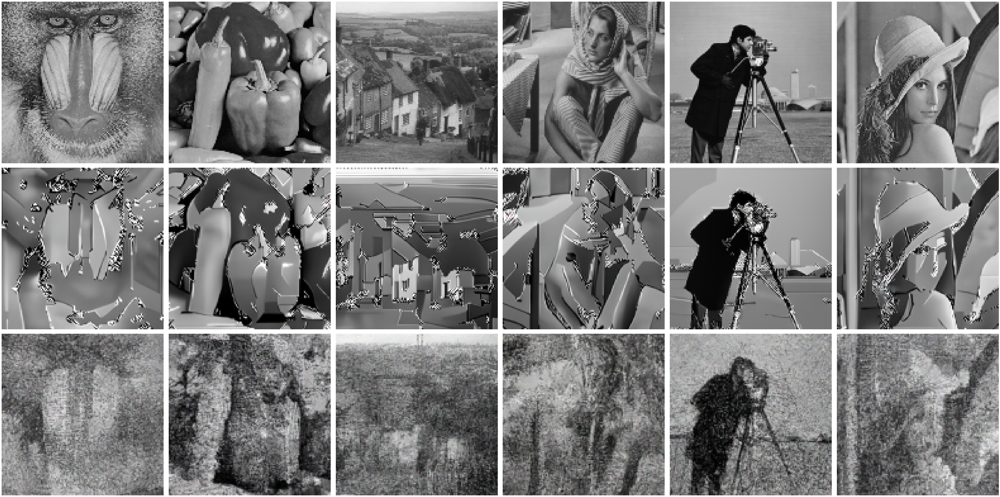

In [10]:
plt.figure(figsize = (6*10, 3*10))
for i in range(6):
    plt.subplot(3,6,i+1)
    plt.imshow(ori_imgs[i+1], cmap="gray", norm=plt.Normalize(0,1)) 
    plt.axis("off") 
    
    plt.subplot(3,6,i+1+6)
    plt.imshow(of_ode[i].transpose(1,2,0))
    plt.axis("off") 
    
    plt.subplot(3,6,i+1+6*2)
    plt.imshow(of_sde[i].transpose(1,2,0))
    plt.axis("off") 

plt.tight_layout(pad=2)
plt.savefig("./res_images/out_train_gaussian_res.jpg")

## 第二节：使用不同位移下的光纤的观测矩阵

In [14]:
f1 = h5py.File("./recv_unknown_dismatch.h5","r")
f2 = h5py.File("./recv_known_0.h5","r")
f3 = h5py.File("./recv_known_25.h5","r")

In [15]:
def parse_f_known(f):
    imgs = np.array(f["values"])
    GI = np.array(f["GI"]).squeeze(0).transpose(1,2,0)
    Img_konwn = [GI] + [imgs[i,...].transpose(1,2,0) for i in range(6)]
    return Img_konwn

def parse_f_unknown(f):
    GI_recv = np.array(f["GI"]).squeeze(0).transpose(1,2,0)
    Img_recvs = [GI_recv] + [np.array(f["Img_{}".format(i)]).squeeze(0).transpose(1,2,0) for i in range(6)]
    return Img_recvs

In [16]:
Img_konwn_0 = parse_f_known(f2)
Img_konwn_25 = parse_f_known(f3)

In [17]:
Img_recvs_dismatch = parse_f_unknown(f1)

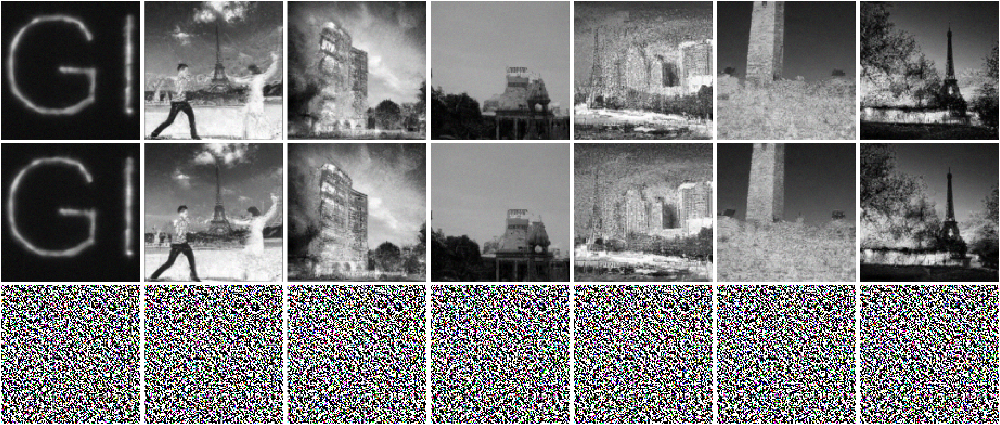

In [19]:
t=len(Img_konwn_0)
r=3
plt.figure(figsize = (t*10, r*10))
for i in range(t):
    plt.subplot(r,t,i+1)
    plt.imshow(Img_konwn_0[i])
    plt.axis("off") 
    
    plt.subplot(r,t,i+1+t)
    plt.imshow(Img_konwn_25[i])
    plt.axis("off") 
    
    plt.subplot(r,t,i+1+2*t)
    plt.imshow(Img_recvs_dismatch[i])    
    plt.axis("off")
    
plt.tight_layout(pad=2)
plt.savefig("./res_images/diff_displacement_dismatch.jpg")

## 第三节：不同预观测图像对未知图像的恢复结果

In [13]:
fp_GI = h5py.File("./diff_pre_images/GI.h5")
fp_in_0 = h5py.File("./diff_pre_images/in_0.h5")
fp_s_5 = h5py.File("./diff_pre_images/s_0.5.h5")

In [14]:
def read_fp(fp):
    return np.array(fp["Pre_Img"]).squeeze(0).transpose(1,2,0), np.array(fp["Error"]), fp["Time"][0], np.array(fp["Img_0"]).squeeze(0).transpose(1,2,0)

In [15]:
GI_res = read_fp(fp_GI)
in_0_res = read_fp(fp_in_0)
s_5_res = read_fp(fp_s_5)
res = [GI_res, in_0_res, s_5_res]

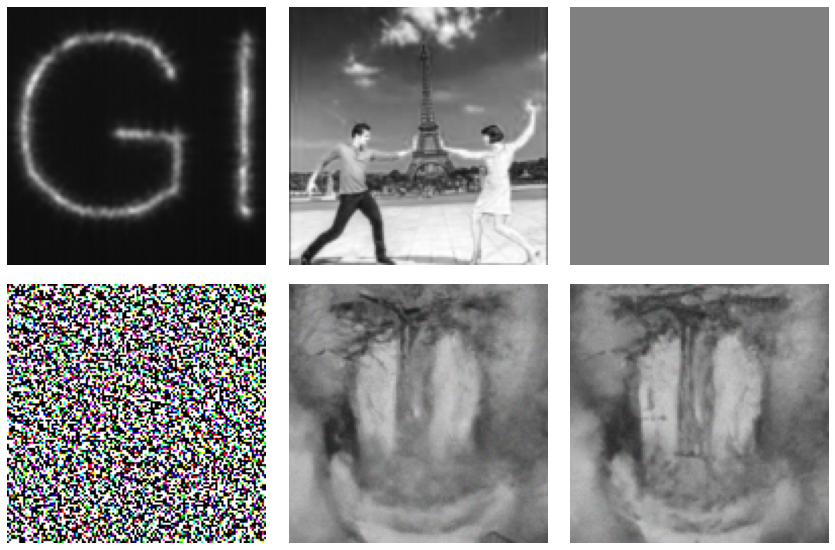

In [16]:
c = len(res)
plt.figure(figsize = (c*4, 2*4))
for i in range(c):
    plt.subplot(2,c,i+1)
    plt.imshow(res[i][0], cmap="gray", norm=plt.Normalize(0,1))    
    plt.axis("off")
    
    plt.subplot(2,c,i+1+c)
    plt.imshow(res[i][3], cmap="gray", norm=plt.Normalize(0,1))    
    plt.axis("off")
    
plt.tight_layout(pad=2)
plt.savefig("./res_images/diff_pre_images_res_one.jpg")

23.795895099639893 23.558425188064575
0.29004738 6.0839844e-05 8.4277344e-05


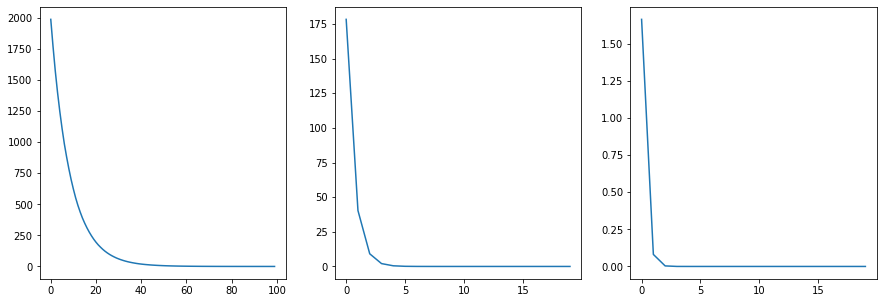

In [17]:
x=range(201)
plt.figure(figsize = (3*5, 1*5))
plt.subplot(1,3,1)
plt.plot(x[:100],GI_res[1][:100])
plt.subplot(1,3,2)
plt.plot(x[:20],in_0_res[1][:20])
plt.subplot(1,3,3)
plt.plot(x[:20],s_5_res[1][:20])
print(GI_res[2],in_0_res[2])
print(GI_res[1][99],in_0_res[1][19],s_5_res[1][19])
# plt.savefig("./res_images/diff_pre_images_errors.jpg")

0.27757052 57.61278033256531


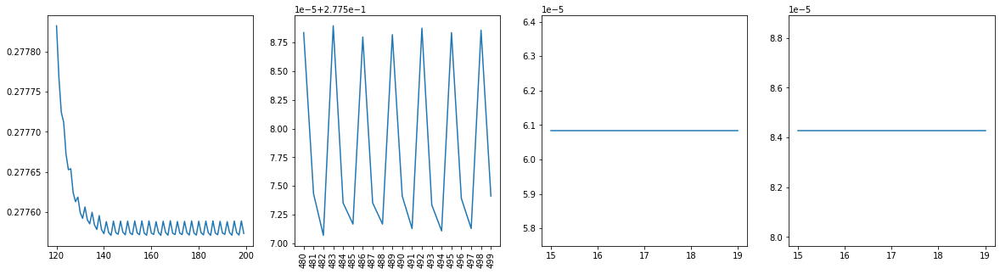

In [27]:
ff3 = h5py.File("./diff_pre_images/recv_unknown_no_train_gi.h5")
e_500_res=np.array(ff3["Error"])
print(e_500_res[-1], ff3["Time"][0])

x=range(201)
plt.figure(figsize = (4*5, 1*5))
plt.subplot(1,4,1)
plt.plot(x[120:200], GI_res[1][120:200])
plt.ticklabel_format(style='scientific',useOffset=True,axis='y')

plt.subplot(1,4,2)
x2 = range(501)
plt.plot(x2[480:500], e_500_res[480:500])
plt.xticks(x2[480:500], rotation=90)
# plt.ticklabel_format(style='plain',useOffset=False)

plt.subplot(1,4,3)
plt.plot(x[15:20],in_0_res[1][15:20])
plt.subplot(1,4,4)
plt.plot(x[15:20],s_5_res[1][15:20])

plt.savefig("./res_images/diff_pre_images_errors_local_scale.jpg")
ff3.close()

## 结果展示

In [6]:
# 原始图
ori_f = h5py.File("./diff_pre_images/recv_unknown_no_train_ori.h5")
names=[
    "GI",
    "Baboon",
    "Peppers",
    "Goldhill",
    "Barbara",
    "Cameraman",
    "Lena"
]
ori_imgs = [np.array(ori_f[i]).squeeze(0).transpose(1,2,0) for i in names]  

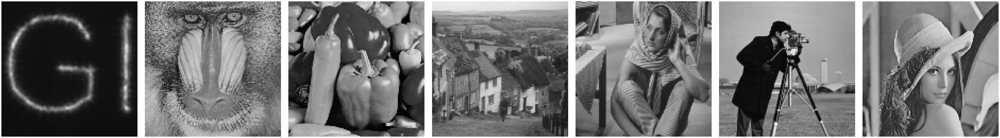

In [29]:
plt.figure(figsize = (7*10, 1*10))
for i in range(7):
    plt.subplot(1,7,i+1)
    plt.imshow(ori_imgs[i], cmap="gray", norm=plt.Normalize(0,1))    
    plt.axis("off")
plt.tight_layout(pad=2)
plt.savefig("./res_images/out_train_ori.jpg")

In [4]:
def parse_f_no_train(f):
    return [np.array(f["Img_{}".format(i)]).squeeze(0).transpose(1,2,0) for i in range(6)]
epochs=[20,30,50]

- in_0 : 20 / GI (30)
- 0.5_gray : 20 / GI (30)
- GI : 150

In [5]:
ff = h5py.File("./diff_pre_images/recv_unknown_no_train_in_0.h5")
GLs = [np.array(ff["GI{}".format("" if i==20 else "_" + str(i))]).squeeze(0).transpose(1,2,0) for i in epochs]  
Img_recvs_no_train_two_loop_in_0 = [GLs[1]] + parse_f_no_train(ff)

In [6]:
ff2 = h5py.File("./diff_pre_images/recv_unknown_no_train_s_0.5.h5")
GLs2 = [np.array(ff2["GI{}".format("" if i==20 else "_" + str(i))]).squeeze(0).transpose(1,2,0) for i in [30]]  
Img_recvs_no_train_two_loop_s_5 = [GLs2[0]] + parse_f_no_train(ff2)

In [7]:
ff3 = h5py.File("./diff_pre_images/recv_unknown_no_train_gi.h5")  
Img_recvs_no_train_two_loop_gi = [np.array(ff3["GI"]).squeeze(0).transpose(1,2,0)] + parse_f_no_train(ff3)

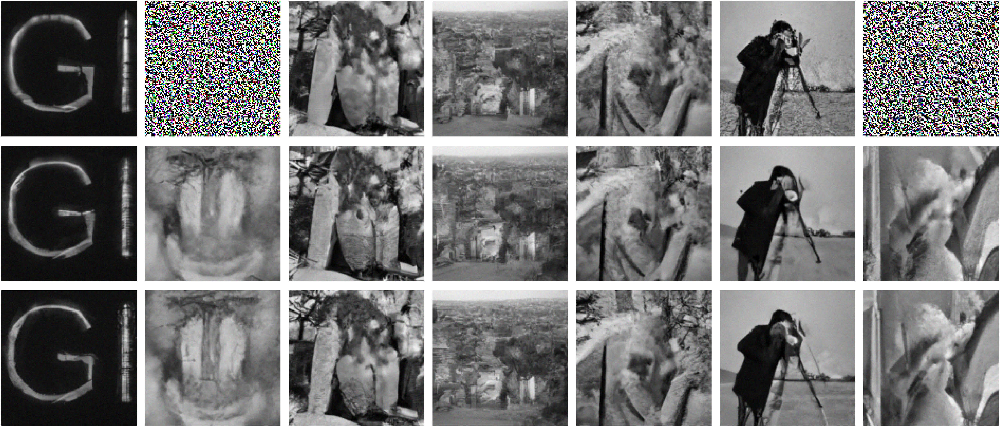

In [9]:
plt.figure(figsize = (7*10, 3*10))
for i in range(7):
    plt.subplot(3,7,i+1)
    plt.imshow(Img_recvs_no_train_two_loop_gi[i])    
    plt.axis("off")
    
    plt.subplot(3,7,i+1+7)
    plt.imshow(Img_recvs_no_train_two_loop_in_0[i])    
    plt.axis("off")
    
    plt.subplot(3,7,i+1+7*2)
    plt.imshow(Img_recvs_no_train_two_loop_s_5[i])    
    plt.axis("off")
    
plt.tight_layout(pad=2, h_pad=5)
plt.savefig("./res_images/diff_pre_images_res.jpg")

In [35]:
gi_error = h5py.File("./diff_pre_images/in_0_gi_error.h5")
gi_error_res=[round(np.array(gi_error["GI_{}_Error".format(i)])[-1], 5 if i==50 else 3) for i in epochs] 

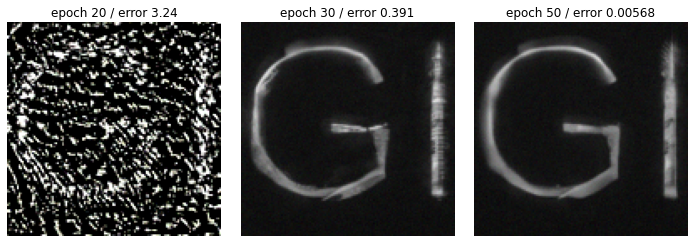

In [36]:
plt.figure(figsize = (1*10, 3*10))
for i in range(3):
    plt.subplot(1,3,i+1)
    plt.imshow(GLs[i])
    plt.title("epoch " + str(epochs[i]) + " / error " + str(gi_error_res[i]))
    plt.axis("off")
    
plt.tight_layout(pad=2)
plt.savefig("./res_images/diff_epoches.jpg")

In [146]:
ff.close()
ff2.close()
ff3.close()

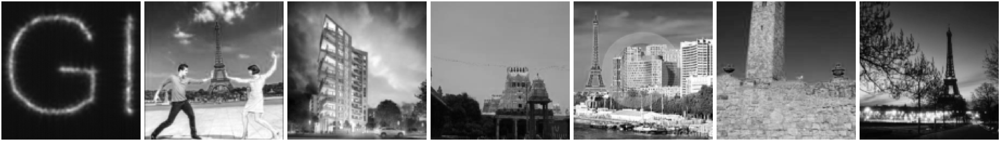

In [12]:
ori_c = [ori_imgs[0]] + [ori[i][0] for i in range(6)]
plt.figure(figsize = (7*10, 3*10))
for i in range(7):
    plt.subplot(1,7,i+1)
    plt.imshow(ori_c[i], cmap="gray", norm=plt.Normalize(0,1))    
    plt.axis("off")
plt.tight_layout(pad=2,h_pad=5)
plt.savefig("./res_images/ori_gi_in_train.jpg")